# Model selection

In [1]:
from IPython import get_ipython

if get_ipython():
    get_ipython().run_line_magic("load_ext", "autoreload")
    get_ipython().run_line_magic("autoreload", "2")

import numpy as np
import pandas as pd
import torch

import xarray as xr

import matplotlib.pyplot as plt
import seaborn as sns

import collections

import latenta as la

la.logger.setLevel("INFO")

## Generative model

In [2]:
n_cells = 1000
cells = la.Dim([str(i) for i in range(n_cells)], "cell")

x1 = la.Fixed(
    pd.Series(np.random.uniform(0, 1, cells.size), index=cells.index),
    label="x1",
    symbol="x1",
)
x1.distribution = la.distributions.Uniform(definition=x1)
x2 = la.Fixed(
    pd.Series(np.random.uniform(0, 1, cells.size), index=cells.index),
    label="x2",
    symbol="x2",
)
x2.distribution = la.distributions.Uniform(definition=x2)

In [3]:
gene_infos = {}
gene_outputs = {}

In [4]:
n_genes = 20
genes = la.Dim(pd.Series([f"constant {i}" for i in range(n_genes)], name="gene"))
gene_infos.update({gene_id: {"type": "constant"} for gene_id in genes.index})

In [5]:
def random_a(n_genes):
    return np.random.choice([-1, 1], n_genes) * np.random.uniform(1.0, 2.0, n_genes)


def random_x(n_genes):
    return np.random.uniform(0.15, 0.85, n_genes)

In [6]:
n_genes = 20
gene_type = "linear(x1)"
genes = la.Dim(pd.Series([f"{gene_type} {i}" for i in range(n_genes)], name="gene"))
gene_infos.update({gene_id: {"type": gene_type} for gene_id in genes.index})

a = la.Fixed(pd.Series(random_a(n_genes), index=genes.index), label="a")

gene_outputs[gene_type] = la.links.scalar.Linear(x1, a)

In [7]:
n_genes = 20
gene_type = "switch(x1)"
genes = la.Dim(pd.Series([f"{gene_type} {i}" for i in range(n_genes)], name="gene"))
gene_infos.update({gene_id: {"type": gene_type} for gene_id in genes.index})

a = la.Fixed(pd.Series(random_a(n_genes), index=genes.index), label="a")
switch = la.Fixed(pd.Series(random_x(n_genes), index=genes.index))

gene_outputs[gene_type] = la.links.scalar.Switch(x1, a=a, switch=switch)

In [8]:
n_genes = 20
gene_type = "linear(x2)"
genes = la.Dim(pd.Series([f"{gene_type} {i}" for i in range(n_genes)], name="gene"))
gene_infos.update({gene_id: {"type": gene_type} for gene_id in genes.index})

a = la.Fixed(pd.Series(random_a(n_genes), index=genes.index), label="a")

gene_outputs[gene_type] = la.links.scalar.Linear(x2, a)

In [9]:
n_genes = 20
gene_type = "spline(x1)"
genes = la.Dim(pd.Series([f"{gene_type} {i}" for i in range(n_genes)], name="gene"))
gene_infos.update({gene_id: {"type": gene_type} for gene_id in genes.index})

knot = la.Fixed(
    pd.Series(np.linspace(0.0, 1.0, 10), index=pd.Series(range(10), name="knot"))
)
a = la.Fixed(
    pd.DataFrame(
        np.random.rand(n_genes, knot[0].size) * 2 - 1,
        columns=pd.Series(range(10), name="knot"),
        index=genes.index,
    )
)

gene_outputs[gene_type] = la.links.scalar.Spline(
    x1, a=a, knot=knot, smoothness=la.Fixed(10.0)
)

In [10]:
n_genes = 20
gene_type = "linear(x1) + linear(x2)"
genes = la.Dim(pd.Series([f"{gene_type} {i}" for i in range(n_genes)], name="gene"))
gene_infos.update({gene_id: {"type": gene_type} for gene_id in genes.index})

a1 = la.Fixed(pd.Series(random_a(n_genes), index=genes.index), label="a")
a2 = la.Fixed(pd.Series(random_a(n_genes), index=genes.index), label="a")
gene_outputs[gene_type] = la.modular.Additive(
    x1=la.links.scalar.Linear(x1, a1),
    x2=la.links.scalar.Linear(x2, a2),
    definition=la.Definition([cells, genes]),
)

In [11]:
n_genes = 20
gene_type = "linear([x1, x2])"
genes = la.Dim(pd.Series([f"{gene_type} {i}" for i in range(n_genes)], name="gene"))
gene_infos.update({gene_id: {"type": gene_type} for gene_id in genes.index})

a = la.Fixed(pd.Series(random_a(n_genes), index=genes.index), label="a")

gene_outputs[gene_type] = la.links.scalars.Linear([x1, x2], a=a)

In [12]:
n_genes = 20
gene_type = "switch([x1, x2])"
genes = la.Dim(pd.Series([f"{gene_type} {i}" for i in range(n_genes)], name="gene"))
gene_infos.update({gene_id: {"type": gene_type} for gene_id in genes.index})

a = la.Fixed(pd.Series(random_a(n_genes), index=genes.index), label="a")
gene_outputs[gene_type] = la.links.scalars.Linear(
    [
        la.links.scalar.Switch(
            x1, switch=la.Fixed(pd.Series(random_x(n_genes), index=genes.index))
        ),
        la.links.scalar.Switch(
            x2, switch=la.Fixed(pd.Series(random_x(n_genes), index=genes.index))
        ),
    ],
    a=a,
)

In [13]:
n_genes = 20
gene_type = "linear([switch(x1), x2])"
genes = la.Dim(pd.Series([f"{gene_type} {i}" for i in range(n_genes)], name="gene"))
gene_infos.update({gene_id: {"type": gene_type} for gene_id in genes.index})

a = la.Fixed(pd.Series(random_a(n_genes), index=genes.index), label="a")
gene_outputs[gene_type] = la.links.scalars.Linear(
    [
        la.links.scalar.Switch(
            x1, a=la.Fixed(1.0), switch=la.Fixed(0.5), label="X_activity"
        ),
        x2,
    ],
    a=a,
)

In [14]:
n_genes = 20
gene_type = "complicated([x1, x2])"
genes.index = pd.Series([f"{gene_type} {i}" for i in range(n_genes)], name="gene")
gene_infos.update({gene_id: {"type": gene_type} for gene_id in genes.index})

n_knots = [10, 10]
knots_value = np.dstack(
    np.meshgrid(np.linspace(0, 1, n_knots[0]), np.linspace(0, 1, n_knots[1]))
).reshape(-1, 2)
knots_dim = la.Dim(pd.Series(range(knots_value.shape[0]), name="knot"))
knots = [
    la.Fixed(pd.Series(knots_value[:, 0], index=knots_dim.index)),
    la.Fixed(pd.Series(knots_value[:, 1], index=knots_dim.index)),
]
a = la.Fixed(
    pd.DataFrame(
        np.random.rand(n_genes, knots_dim.size) * 4 - 1,
        columns=knots_dim.index,
        index=genes.index,
    )
)
smoothness = la.Fixed(10.0)
gene_outputs[gene_type] = la.links.scalars.Thinplate(
    [x1, x2], knots=knots, a=a, smoothnesses=smoothness, n_knots=n_knots
)

In [15]:
gene_info = pd.DataFrame.from_dict(gene_infos, orient="index")
gene_info.index.name = "gene"

In [16]:
genes = la.Dim(gene_info.index)
output = la.modular.Additive(
    0.0, la.Definition([cells, genes]), label="output", subsettable={genes}
)

In [17]:
for component_id, component in gene_outputs.items():
    setattr(output, component_id, component)

In [18]:
scale = la.Fixed(0.5)

In [19]:
dist = la.distributions.Normal(loc=output, scale=scale)


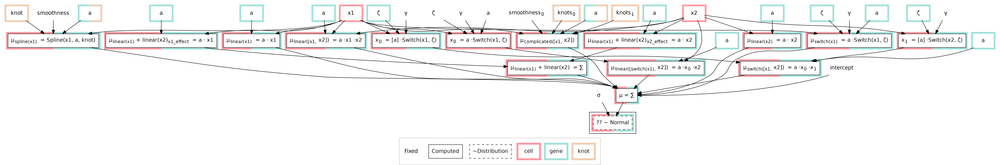

In [20]:
model_gs = la.Root(dist)
model_gs.plot()

In [21]:
posterior = la.posterior.Posterior(dist)
posterior.sample(1)

  0%|          | 0/1 [00:00<?, ?it/s]

<AxesSubplot:xlabel='gene', ylabel='cell'>

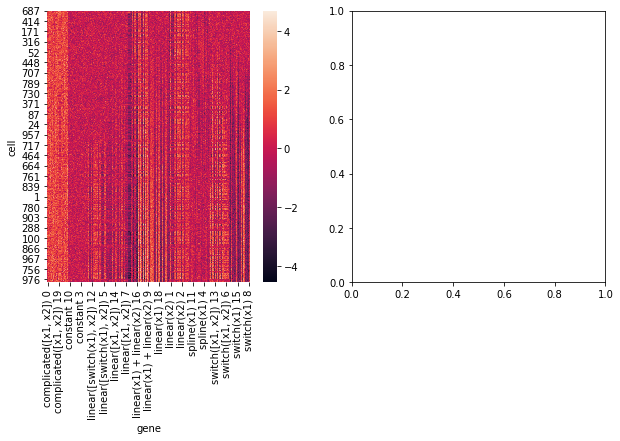

In [22]:
observation_value = posterior.samples[dist].sel(sample=0).to_pandas()
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(10, 5))
cell_order = model_gs.find("x1").prior_pd().sort_values().index
sns.heatmap(observation_value.loc[cell_order], ax=ax0)

In [23]:
output.empirical = observation_value

In [24]:
x1_causal = la.posterior.scalar.ScalarVectorCausal(x1, dist, observed=posterior)
x1_causal.sample(5)
x2_causal = la.posterior.scalar.ScalarVectorCausal(x2, dist, observed=posterior)
x2_causal.sample(5)
x1_x2_causal = la.posterior.scalarscalar.ScalarScalarVectorCausal(x1_causal, x2_causal)
x1_x2_causal.sample(5, n_batch=40)

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

In [25]:
gene_ids = gene_info.groupby("type").sample(1).index

/home/wsaelens/projects/probabilistic-cell/latenta/src/latenta/posterior/scalar/scalarscalar/causal.py:297: UserWarning: No contour levels were found within the data range.
  contour = ax.contour(data["x"]["mesh"], data["y"]["mesh"], data["z"]["mesh"], cmap=cmap)


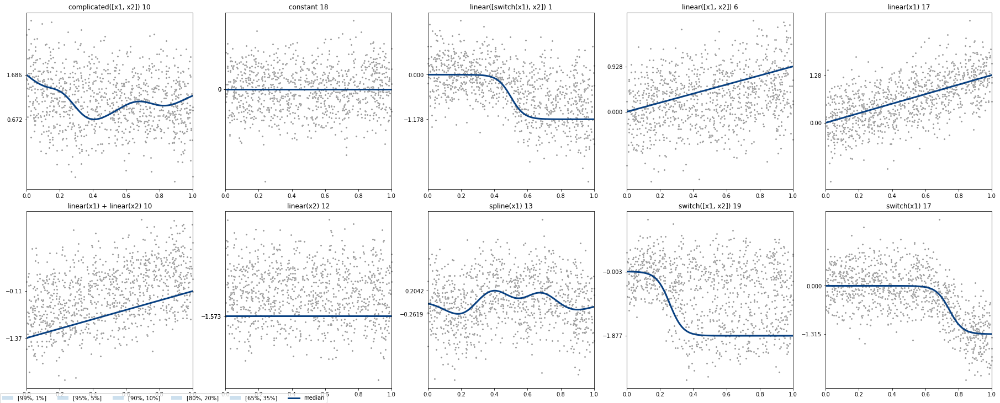

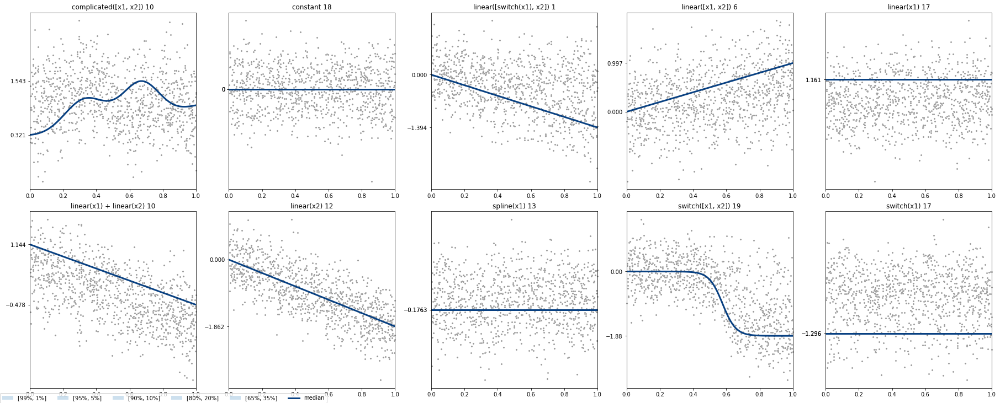

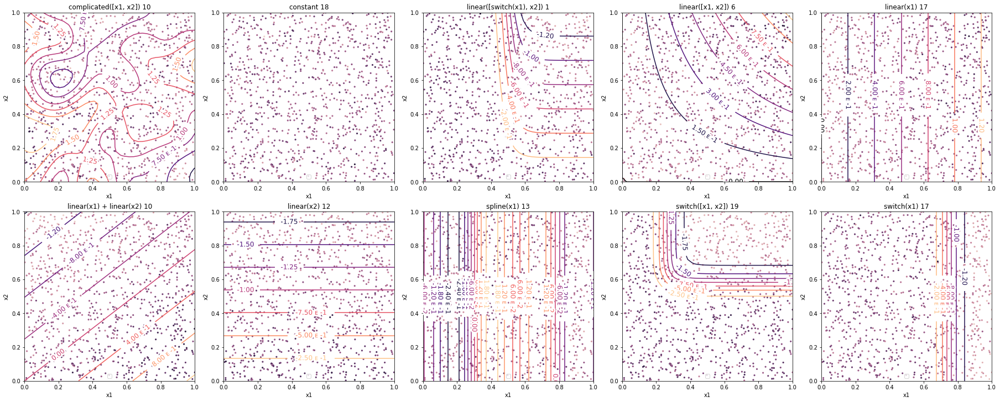

In [26]:
x1_causal.plot_features(feature_ids=gene_ids)
x2_causal.plot_features(feature_ids=gene_ids)
x1_x2_causal.plot_features_contour(feature_ids=gene_ids)

## Creating the different models

In [27]:
models = {}

### Constant

In [28]:
output.reset()

In [29]:
mu = la.modular.Additive(
    intercept=la.Parameter(0.0, la.Definition([genes])),
    definition=output.value_definition,
    subsettable={genes},
)
s = la.Parameter(
    1.0,
    definition=la.Definition([genes]),
    transforms=la.distributions.Exponential().transform_to(),
)

In [30]:
mu.x1 = la.links.scalar.Constant(x1, output=mu.value_definition)
mu.x2 = la.links.scalar.Constant(x2, output=mu.value_definition)

In [31]:
dist = la.distributions.Normal(mu, s)
observation = la.Observation(observation_value, dist, label="observation")
mu.empirical = observation_value


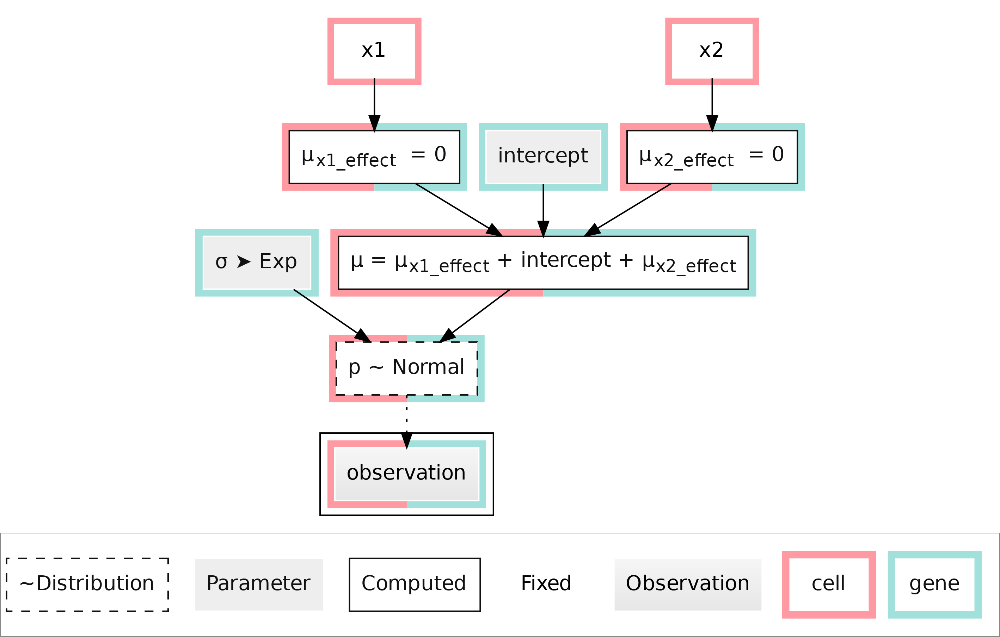

In [32]:
model_constant = la.Root(observation)
models["constant"] = model_constant
model_constant.plot()

In [33]:
model_constant2 = model_constant.clone()
assert (
    model_constant.observation.p.loc.x1.x.loader.value
    is model_constant2.observation.p.loc.x1.x.loader.value
)
assert not (model_constant.observation.p.scale is model_constant2.observation.p.scale)

### Additive spline model


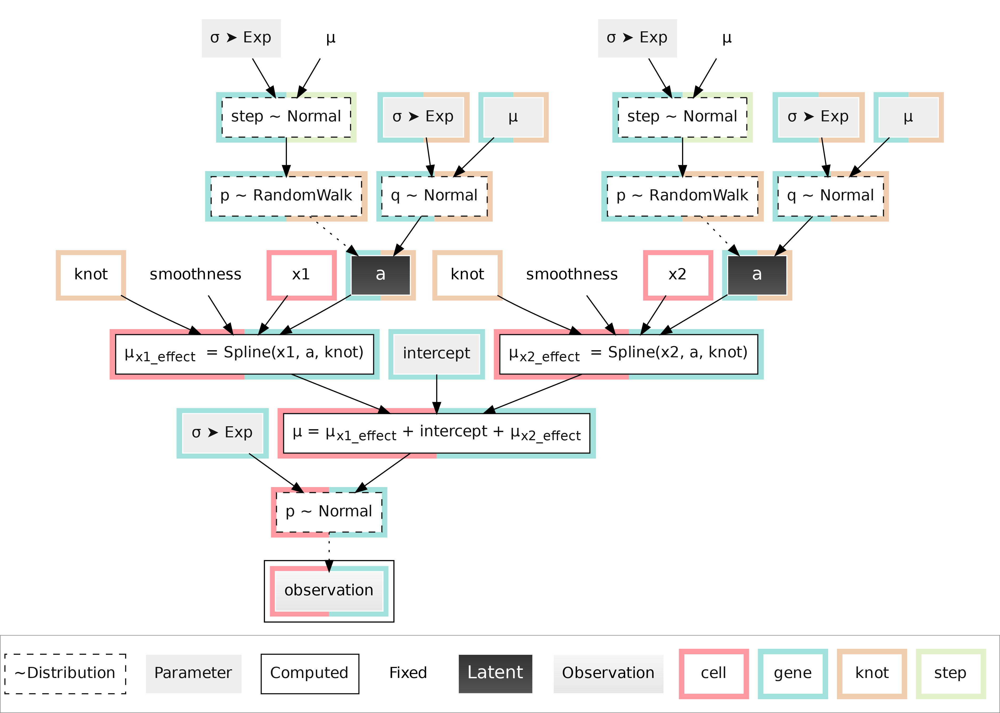

In [34]:
model = la.Root(model_constant.observation.clone())

mu = model.observation.p.loc
mu.x1 = la.links.scalar.Spline(x1, output=mu)
mu.x2 = la.links.scalar.Spline(x2, output=mu)

models["spline(x1) + spline(x2)"] = model

model.plot()

### Thin plate


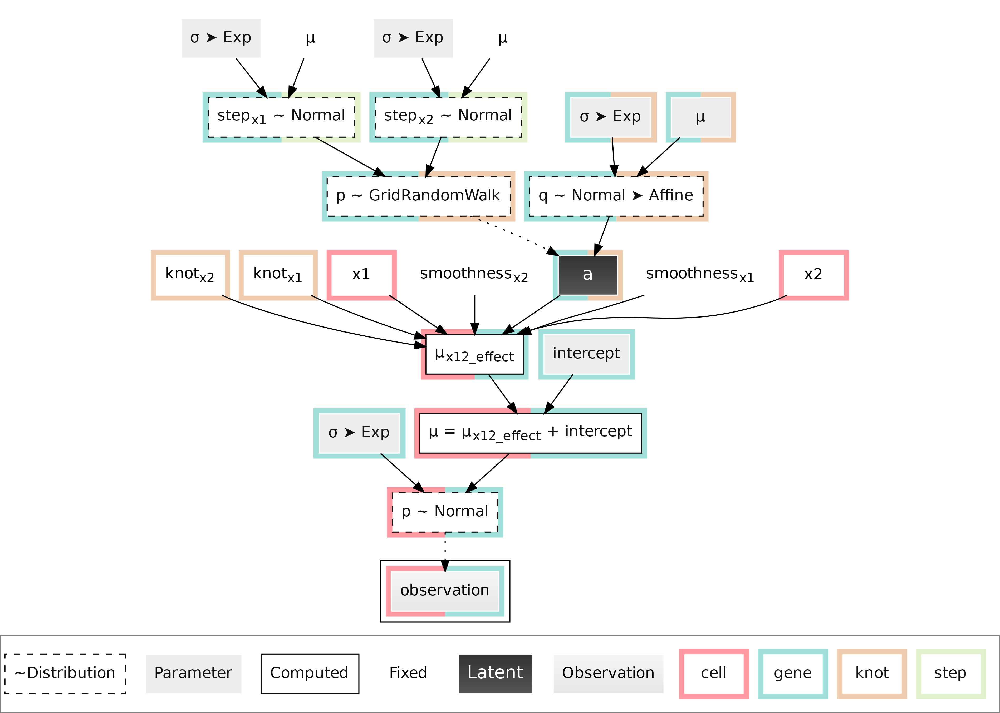

In [35]:
model = la.Root(model_constant.observation.clone())

mu = model.observation.p.loc
del mu.x1
del mu.x2
mu.x12 = la.links.scalars.Thinplate({"x1": x1, "x2": x2}, output=mu)

models["thinplate([x1, x2])"] = model
model.plot()

### Additive switch model


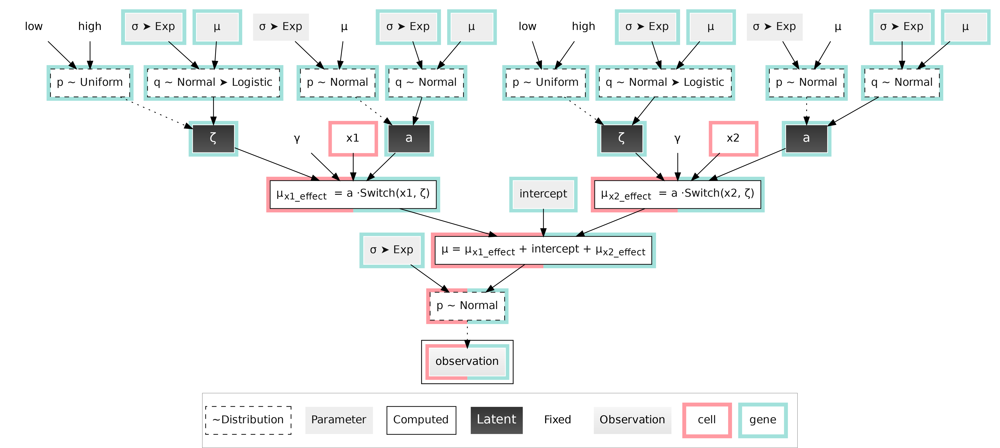

In [36]:
model = la.Root(model_constant.observation.clone())
x1 = model.find("x1")
x2 = model.find("x2")

mu = model.observation.p.loc
mu.x1 = la.links.scalar.Switch(x1, switch=True, a=True, output=mu.value_definition)
mu.x2 = la.links.scalar.Switch(x2, switch=True, a=True, output=mu.value_definition)

models["switch(x1) + switch(x2)"] = model
model.plot()

### Multiplicative switch model


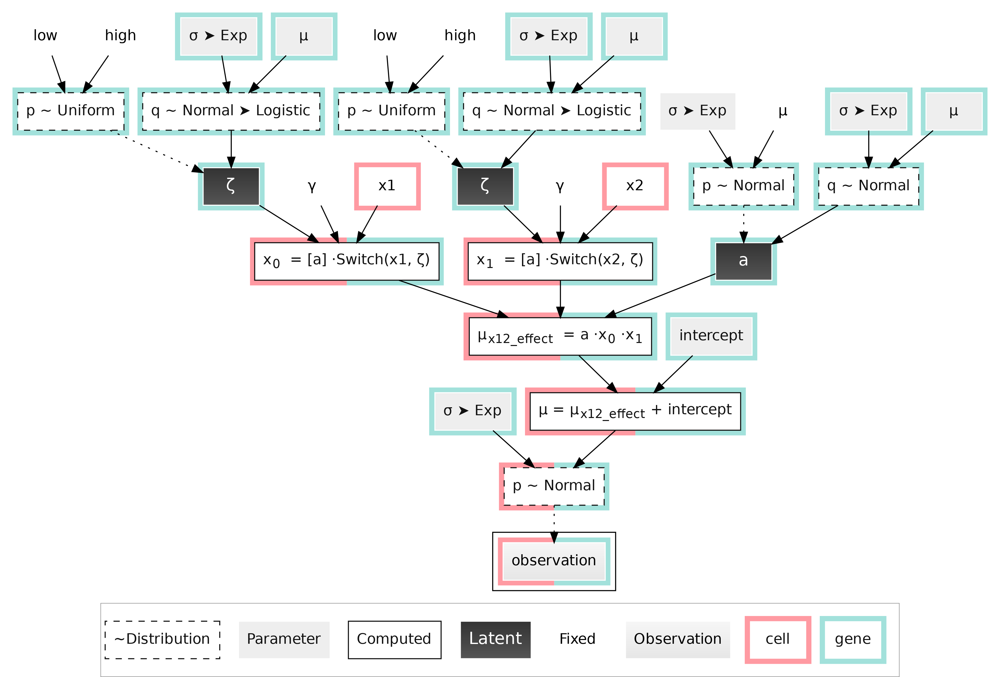

In [37]:
model = la.Root(model_constant.observation.clone())
x1 = model.find("x1")
x2 = model.find("x2")

mu = model.observation.p.loc
del mu.x1
del mu.x2
mu.x12 = la.links.scalars.Linear(
    [
        la.links.scalar.Switch(x1, switch=True, output=mu),
        la.links.scalar.Switch(x2, switch=True, output=mu),
    ],
    a=la.Definition([genes]),
)

models["switch([x1, x2])"] = model
model.plot()

### Single and multiplicative switch model with shared switch


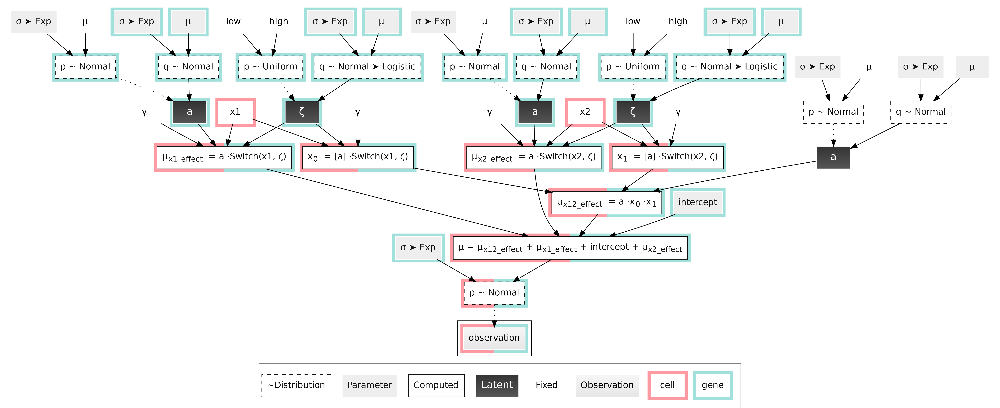

In [38]:
model = la.Root(model_constant.observation.clone())
x1 = model.find("x1")
x2 = model.find("x2")

mu = model.observation.p.loc
mu.x1 = la.links.scalar.Switch(x1, switch=True, a=True, output=mu)
mu.x2 = la.links.scalar.Switch(x2, switch=True, a=True, output=mu)
mu.x12 = la.links.scalars.Linear(
    [
        la.links.scalar.Switch(x1, switch=mu.x1.switch),
        la.links.scalar.Switch(x2, switch=mu.x2.switch),
    ],
    a=True,
    output=mu,
)

models["switch(x1, s1) + switch(x2, s2) + switch([x1, x2], [s1, s2])"] = model
model.plot()

### Linear additive


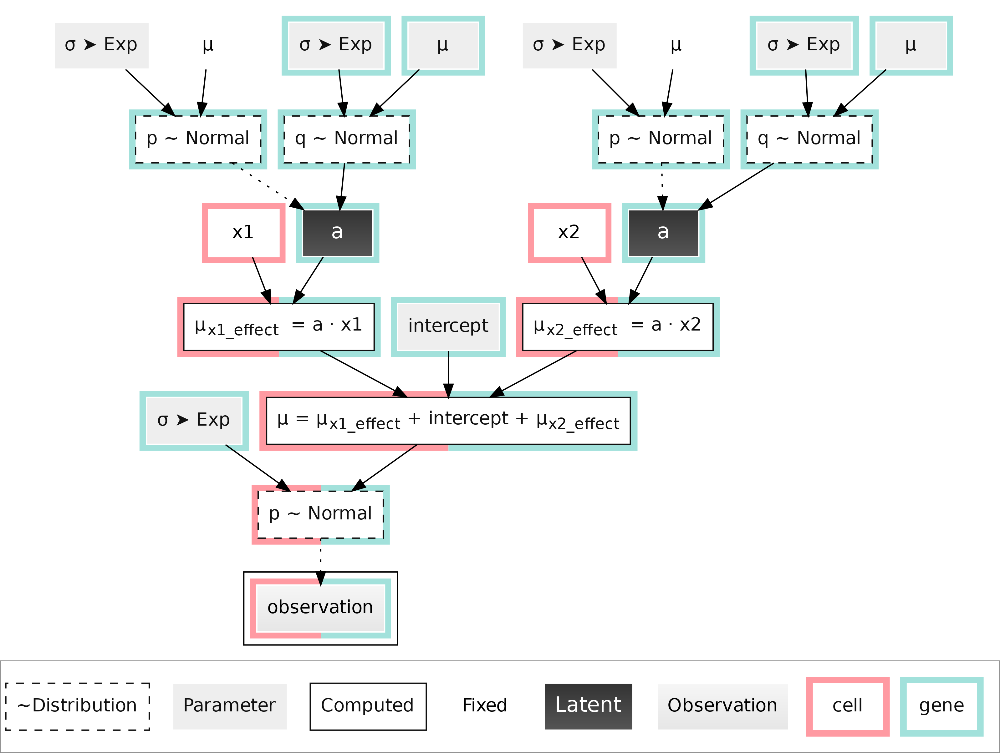

In [39]:
model = la.Root(model_constant.observation.clone())
x1 = model.find("x1")
x2 = model.find("x2")

mu = model.observation.p.loc
mu.x1 = la.links.scalar.Linear(x1, a=True, output=mu)
mu.x2 = la.links.scalar.Linear(x2, a=True, output=mu)

models["linear(x1) + linear(x2)"] = model
model.plot()

### Additive linear and interaction


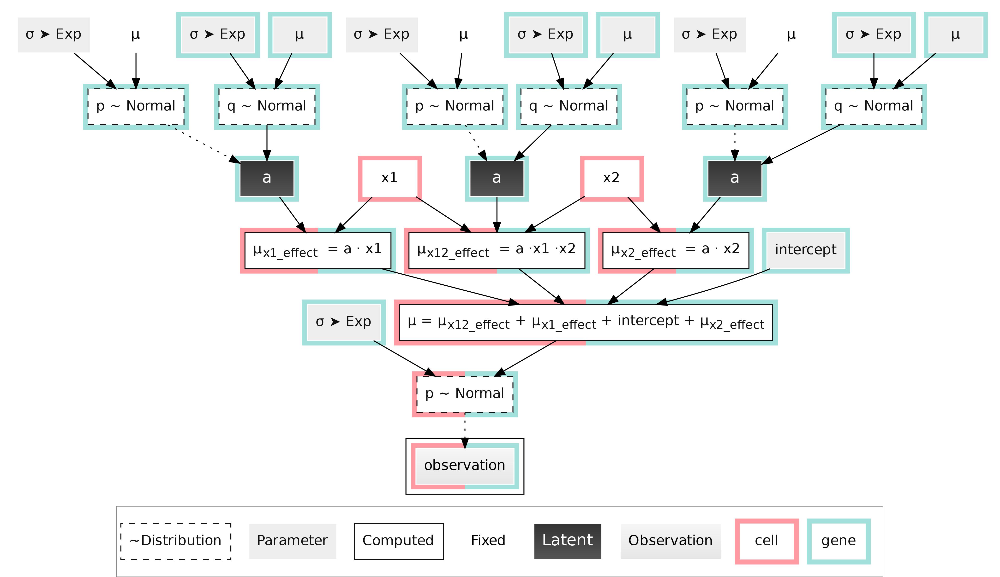

In [40]:
model = la.Root(model_constant.observation.clone())
x1 = model.find("x1")
x2 = model.find("x2")

mu = model.observation.p.loc
mu.x1 = la.links.scalar.Linear(x1, a=True, output=mu)
mu.x2 = la.links.scalar.Linear(x2, a=True, output=mu)
mu.x12 = la.links.scalars.Linear([x1, x2], a=True, output=mu)

models["linear(x1) + linear(x2) + linear([x1, x2])"] = model
model.plot()

### linear(switch(x1), y)


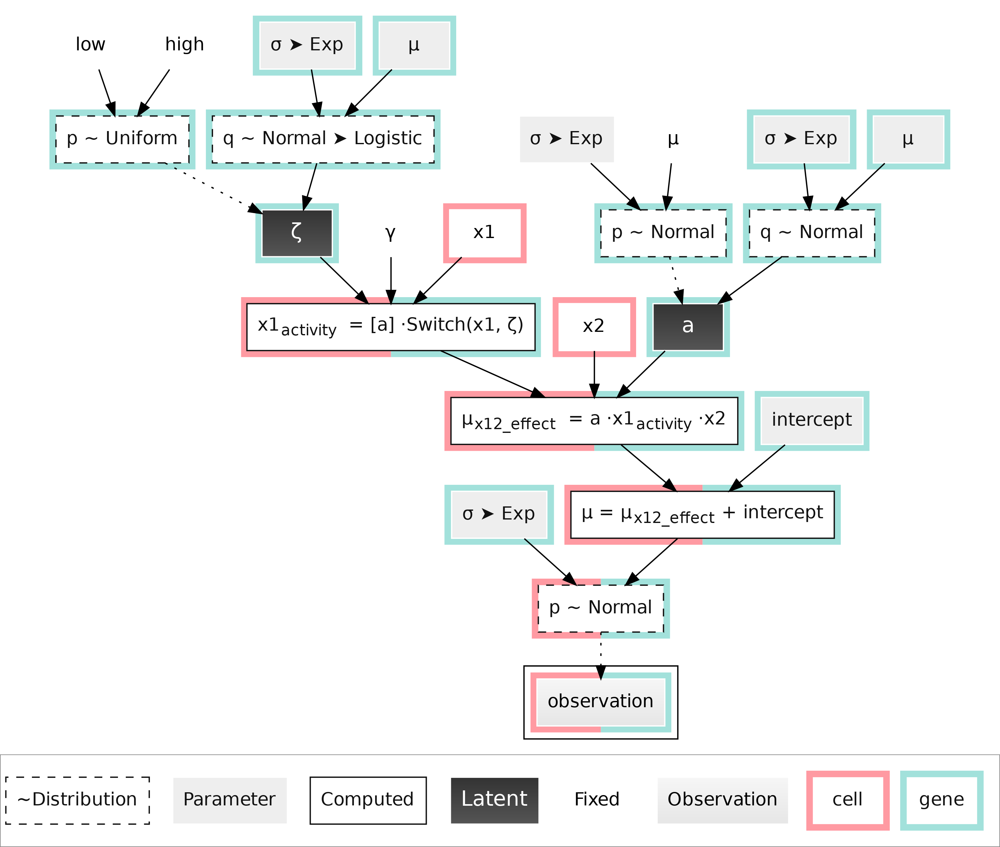

In [41]:
model = la.Root(model_constant.observation.clone())
x1 = model.find("x1")
x2 = model.find("x2")

mu = model.observation.p.loc
del mu.x1
del mu.x2
mu.x12 = la.links.scalars.Linear(
    [
        la.links.scalar.Switch(
            x1, switch=True, label="x1 activity", symbol="x1_activity", output=mu
        ),
        x2,
    ],
    a=la.Definition([genes]),
    output=mu,
)

models["linear([switch(x1), x2])"] = model
model.plot()

### embedding

To illustrate why model selection is necessary, we can also create an extremely flexible embedding model that will certainly overfit. Overfitting in this context means that the embedding will contain information coming from technical noise.

Note that, in a typical use case, we would use an amortization function to infer the latent space, but this is not necessary in this case as we're simply using a linear function on a simple dataset.


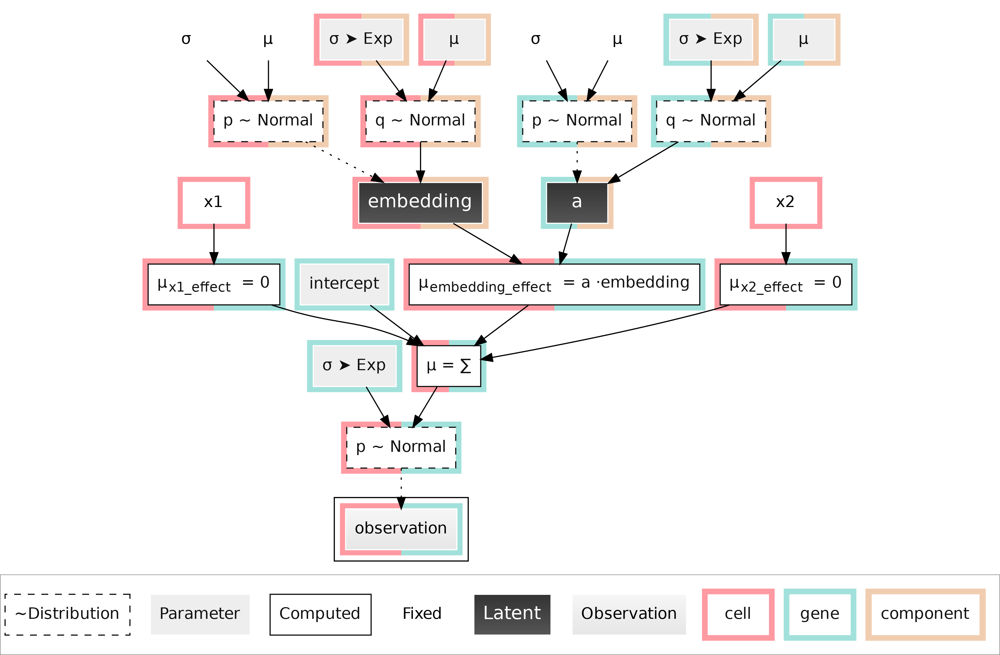

In [42]:
model = la.Root(model_constant.observation.clone())

mu = model.observation.p.loc
# del mu.x1
# del mu.x2

components = la.Dim(20, "component")
embedding = la.Latent(
    la.distributions.Normal(0.0, 1.0),
    definition=la.Definition([cells, components]),
    label="embedding",
    symbol="embedding",
)
a = la.Latent(la.distributions.Normal(), definition=la.Definition([genes, components]))

mu.embedding = la.links.vector.Matmul(embedding, a)

models["embedding"] = model
model.plot()

---------------------

In [43]:
for model_ix, (model_id, model) in enumerate(models.items()):
    print(model_id)
    #     if model_id != "constant":
    #         continue

    x1 = model.observation.find("x1")
    x2 = model.observation.find("x2")

    #     if "trace" in model: del model["trace"]
    if "trace" not in model:
        inference = la.infer.svi.SVI(
            model, [la.infer.loss.ELBO()], la.infer.optim.Adam(lr=0.05)
        )
        trainer = la.infer.trainer.Trainer(inference)
        model["trace"] = trainer.train(1000)

        inference = la.infer.svi.SVI(
            model, [la.infer.loss.ELBO()], la.infer.optim.Adam(lr=0.01)
        )
        trainer = la.infer.trainer.Trainer(inference)
        model["trace"] = trainer.train(1000)

    #     if "observed" in model: del model["observed"]
    if "observed" not in model:
        model["observed"] = la.posterior.vector.VectorObserved(model.observation)
        model["observed"].sample(5)

    #     if "x1_causal" in model: del model["x1_causal"]
    if "x1_causal" not in model:
        x1_causal = la.posterior.scalar.ScalarVectorCausal(
            x1, model.observation, observed=model["observed"]
        )
        x1_causal.sample(20)
        x1_causal.sample_random(5)
        model["x1_causal"] = x1_causal

    #     if "x2_causal" in model: del model["x2_causal"]
    if "x2_causal" not in model:
        x2_causal = la.posterior.scalar.ScalarVectorCausal(
            x2, model.observation, observed=model["observed"]
        )
        x2_causal.sample(20)
        x2_causal.sample_random(5)
        model["x2_causal"] = x2_causal

    #     if "x1_x2_causal" in model: del model["x1_x2_causal"]
    if "x1_x2_causal" not in model:
        x1_x2_causal = la.posterior.scalarscalar.ScalarScalarVectorCausal(
            model["x1_causal"], model["x2_causal"]
        )
        x1_x2_causal.sample(20, n_batch=20)
        model["x1_x2_causal"] = x1_x2_causal

constant


  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

spline(x1) + spline(x2)


  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

thinplate([x1, x2])


  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

switch(x1) + switch(x2)


  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

switch([x1, x2])


  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

switch(x1, s1) + switch(x2, s2) + switch([x1, x2], [s1, s2])


  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

linear(x1) + linear(x2)


  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

linear(x1) + linear(x2) + linear([x1, x2])


  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

linear([switch(x1), x2])


  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

embedding


  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Explore a model

In [48]:
# model = models["linear(x1) + linear(x2) + linear([x1, x2])"]
# model = models["thinplate([x1, x2])"]
# model = models["constant"]
# model = models["switch(x1) + switch(x2)"]
# model = models["switch([x1, x2])"]
# model = models["spline(x1) + spline(x2)"]
model = models["linear([switch(x1), x2])"]
# model = models["embedding"]

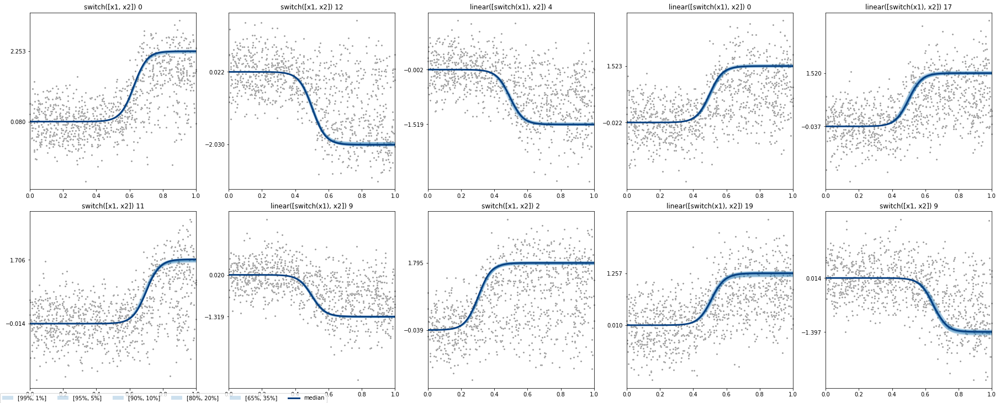

In [49]:
model["x1_causal"].plot_features()

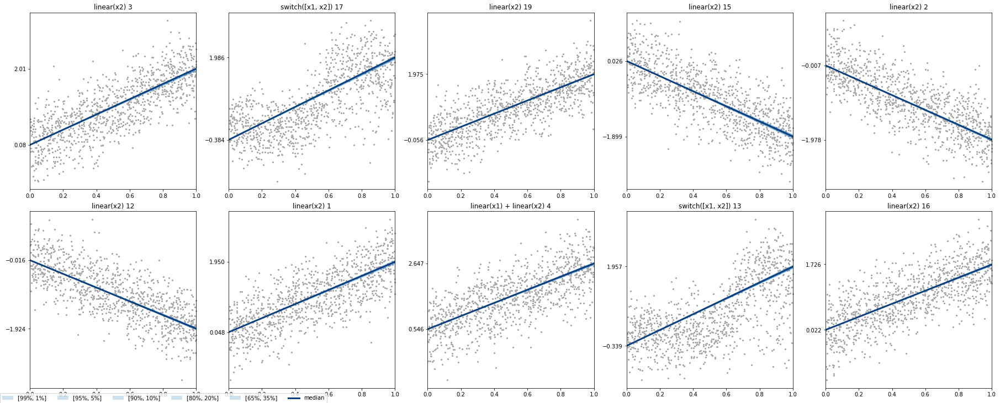

In [50]:
model["x2_causal"].plot_features()

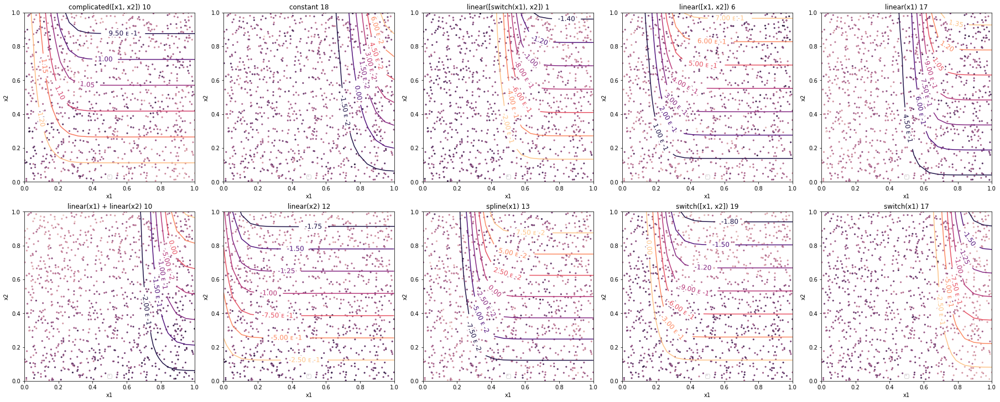

In [51]:
model["x1_x2_causal"].plot_features_contour(feature_ids=gene_ids)

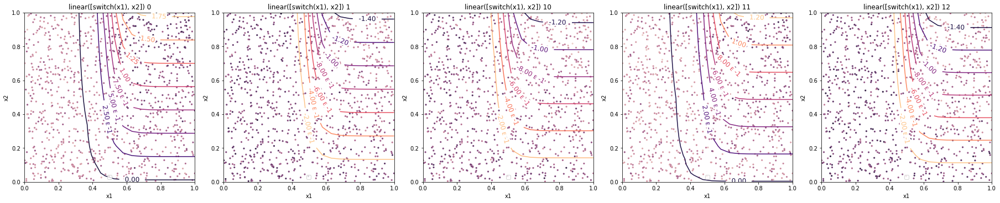

In [52]:
model["x1_x2_causal"].plot_features_contour(
    feature_ids=gene_info.query("type == 'linear([switch(x1), x2])'").index[:5]
)

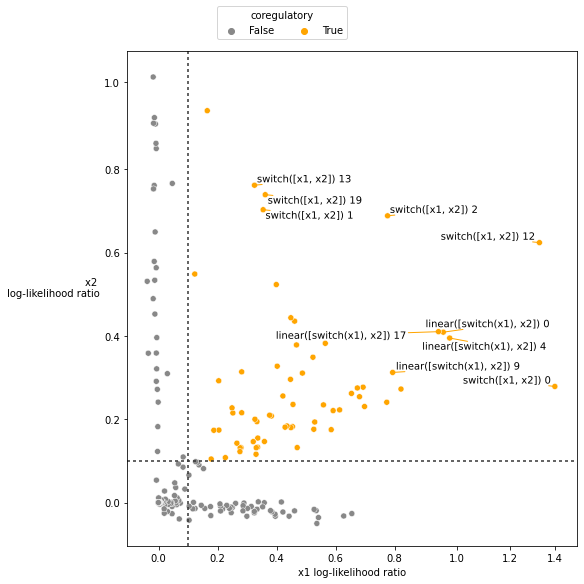

In [53]:
fig = model["x1_x2_causal"].plot_likelihood_ratio()
fig.axes[0].legend(bbox_to_anchor=(0.5, 1.1), ncol=2, title="coregulatory")

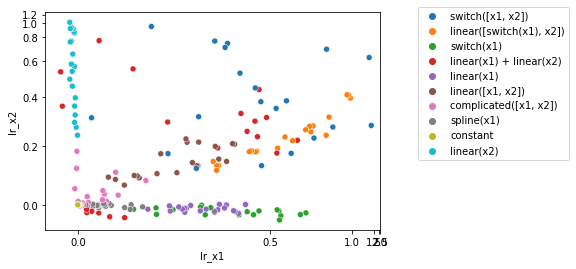

In [54]:
ax = sns.scatterplot(
    x="lr_x1", y="lr_x2", data=model["x1_x2_causal"].scores.join(gene_info), hue="type"
)
ax.legend(bbox_to_anchor=(1.1, 1.05))
ax.set_xscale("sigmoid")
ax.set_yscale("sigmoid")

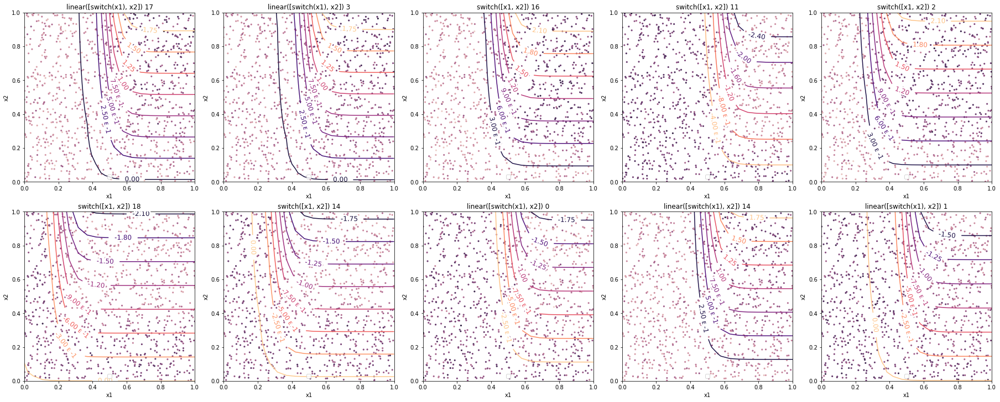

In [51]:
model["x1_x2_causal"].plot_features_contour(
    #     feature_ids = gene_info.query("type == 'switch(x1)'").index
)

## Model selection

In [52]:
model = models["switch(x1) + switch(x2)"]
model = models["switch([x1, x2])"]

In [53]:
# model = models["thinplate([x1, x2])"]
# model["observed"].sample(1)

In [54]:
for model_id, model in models.items():
    print(model_id, model["observed"].elbo.mean().item())

constant -200056.390625
spline(x1) + spline(x2) -156799.6407470703
thinplate([x1, x2]) -158572.7890625
switch(x1) + switch(x2) -159842.4575805664
switch([x1, x2]) -160003.59637451172
switch(x1, s1) + switch(x2, s2) + switch([x1, x2], [s1, s2]) -159824.6122150421
linear(x1) + linear(x2) -161241.009765625
linear(x1) + linear(x2) + linear([x1, x2]) -158657.05535888672
linear([switch(x1), x2]) -168165.66442871094
embedding -170919.875


In [55]:
likelihoods = xr.concat(
    [model["observed"].likelihood_features for model in models.values()],
    dim=pd.Series(models.keys(), name="model"),
).to_pandas()
model_ids = [
    model_id for model_id in likelihoods.index if model_id not in ["embedding"]
]
likelihoods = likelihoods.loc[model_ids]
evidences = xr.concat(
    [model["observed"].elbo_features for model in models.values()],
    dim=pd.Series(models.keys(), name="model"),
).to_pandas()
evidences = evidences.loc[model_ids]

<AxesSubplot:xlabel='model', ylabel='gene'>

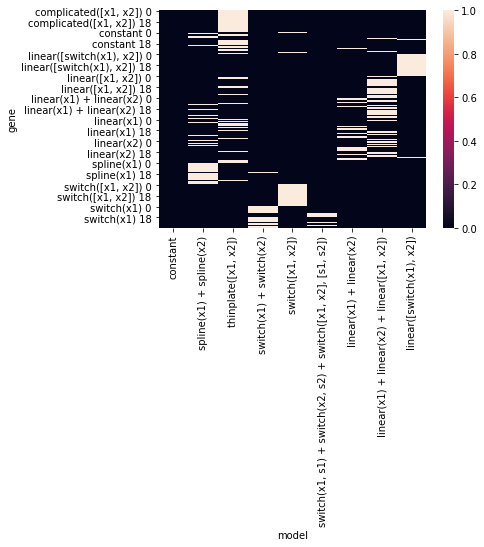

In [56]:
sns.heatmap((likelihoods == likelihoods.max(0)).T)

<AxesSubplot:xlabel='model', ylabel='gene'>

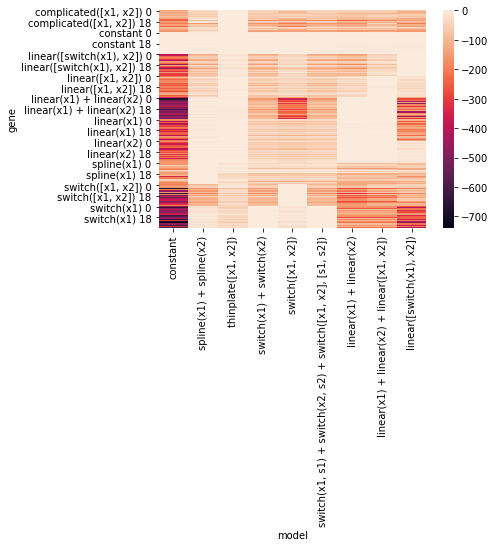

In [57]:
sns.heatmap((likelihoods - likelihoods.max(0)).T)

<AxesSubplot:xlabel='model', ylabel='gene'>

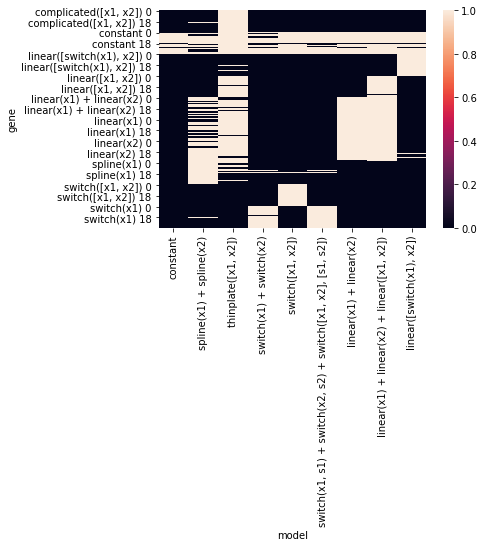

In [58]:
sns.heatmap((likelihoods.max(0) - likelihoods).T < 5)

In [59]:
# evidences = evidences.loc[[i for i in evidences.index if not i.startswith("thinpl")]]

<AxesSubplot:xlabel='model', ylabel='gene'>

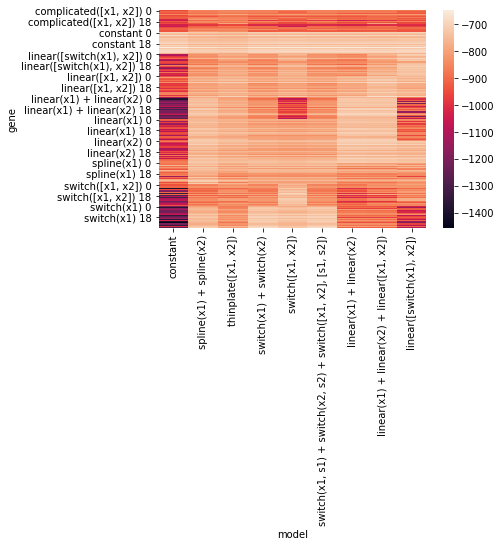

In [60]:
sns.heatmap((evidences).T)

<AxesSubplot:xlabel='model', ylabel='gene'>

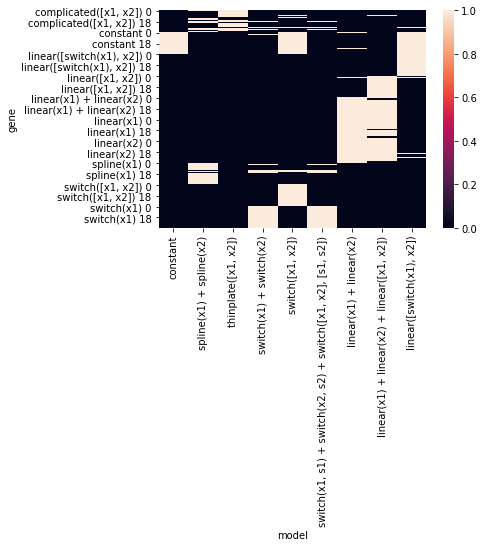

In [61]:
sns.heatmap((evidences.max(0) - evidences).T < 5)

<AxesSubplot:xlabel='model', ylabel='gene'>

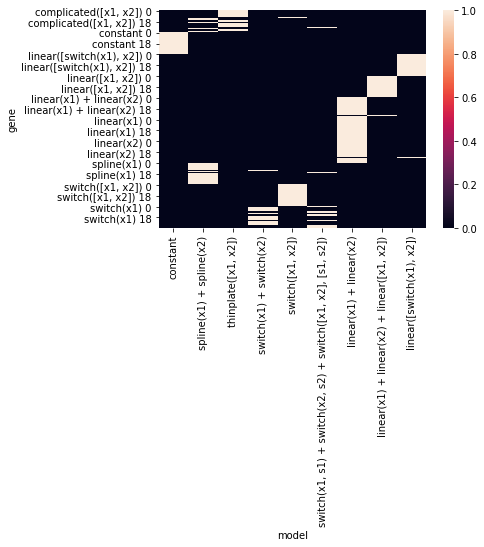

In [62]:
sns.heatmap((evidences == evidences.max()).T)

In [63]:
selected_evidence = evidences == evidences.max()

In [64]:
likelihood_diff = likelihoods - (likelihoods * selected_evidence).min()
undermodelled = (likelihood_diff > 1).any()

In [65]:
gene_info["undermodelled"] = undermodelled

In [66]:
gene_info["selected_evidence"] = selected_evidence.idxmax(0)

In [67]:
gene_info.groupby(["type", "undermodelled"]).count()[
    "selected_evidence"
].unstack().T.fillna(0.0).style.background_gradient(
    cmap=sns.color_palette("Blues", as_cmap=True)
)

type,"complicated([x1, x2])",constant,"linear([switch(x1), x2])","linear([x1, x2])",linear(x1),linear(x1) + linear(x2),linear(x2),spline(x1),"switch([x1, x2])",switch(x1)
undermodelled,,,,,,,,,,
False,13.000000,3.000000,20.000000,17.000000,8.000000,8.000000,14.000000,18.000000,20.000000,18.000000
True,7.000000,17.000000,0.000000,3.000000,12.000000,12.000000,6.000000,2.000000,0.000000,2.000000


In [68]:
pd.crosstab(
    gene_info["selected_evidence"], gene_info["type"]
).style.background_gradient(cmap=sns.color_palette("Blues", as_cmap=True))

type,"complicated([x1, x2])",constant,"linear([switch(x1), x2])","linear([x1, x2])",linear(x1),linear(x1) + linear(x2),linear(x2),spline(x1),"switch([x1, x2])",switch(x1)
selected_evidence,,,,,,,,,,
constant,0,20,0,0,0,0,0,0,0,0
"linear([switch(x1), x2])",0,0,20,0,0,0,1,0,0,0
linear(x1) + linear(x2),0,0,0,0,20,19,19,0,0,0
"linear(x1) + linear(x2) + linear([x1, x2])",0,0,0,20,0,1,0,0,0,0
spline(x1) + spline(x2),5,0,0,0,0,0,0,18,0,0
"switch([x1, x2])",1,0,0,0,0,0,0,0,20,0
switch(x1) + switch(x2),0,0,0,0,0,0,0,1,0,12
"switch(x1, s1) + switch(x2, s2) + switch([x1, x2], [s1, s2])",1,0,0,0,0,0,0,1,0,8
"thinplate([x1, x2])",13,0,0,0,0,0,0,0,0,0


/home/wsaelens/projects/probabilistic-cell/.venv/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:ylabel='type'>

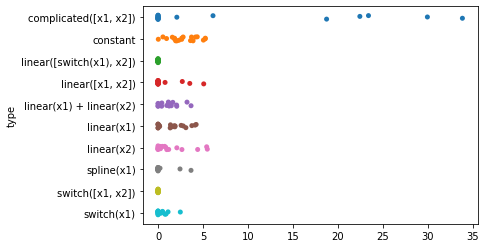

In [69]:
sns.stripplot(likelihood_diff.max(), y=gene_info["type"])